In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Read Dataframe

In [2]:
t_pos = pd.read_csv("data_clean_by_warin\PLM_Train_pos.csv")
t_pos.head()

,AAC1,AAC2,AAC3,AAC4,AAC5,AAC6,AAC7,AAC8,AAC9,AAC10,...,tango5,tango6,comF,comF2,logistic1,logistic5,logistic9,logistic8,logistic15,Class
0,0.000000,0.111111,0.222222,0.111111,0.0,0.000000,0.000000,0.000000,0.000000,0.222222,...,0.0,26.25280,-0.088743,0.461107,0.640088,0.405785,-0.180122,3.729060,-0.272378,NPP
1,0.076923,0.230769,0.076923,0.000000,0.0,0.076923,0.076923,0.153846,0.000000,0.000000,...,0.0,7.69918,-0.094578,0.136850,-0.769709,-0.703704,-0.346362,-0.229722,-0.878981,NPP
2,0.133333,0.033333,0.033333,0.000000,0.0,0.000000,0.000000,0.200000,0.066667,0.000000,...,0.0,31.99430,-0.079358,-0.397529,0.270801,0.079855,-0.743900,-0.363173,-0.382126,NPP
3,0.024390,0.097561,0.048780,0.000000,0.0,0.146342,0.000000,0.097561,0.024390,0.000000,...,0.0,175.50800,-0.080490,0.096029,0.372857,0.303267,-0.787412,0.012065,-0.027945,NPP
4,0.000000,0.181818,0.090909,0.000000,0.0,0.000000,0.000000,0.272727,0.000000,0.000000,...,0.0,5.49902,-0.071267,-0.181775,0.087793,0.089796,0.182100,0.652552,2.621020,NPP


In [3]:
t_neg = pd.read_csv("data_clean_by_warin\PLM_Train_neg.csv")
t_neg.head()

,AAC1,AAC2,AAC3,AAC4,AAC5,AAC6,AAC7,AAC8,AAC9,AAC10,...,tango5,tango6,comF,comF2,logistic1,logistic5,logistic9,logistic8,logistic15,Class
0,0.066667,0.066667,0.066667,0.000000,0.066667,0.00,0.066667,0.066667,0.000,0.000000,...,0.0,32.3239,-0.073585,-0.007688,-1.664300,-1.369820,-0.415233,-0.771874,-1.491290,NonNPP
1,0.000000,0.133333,0.200000,0.066667,0.000000,0.00,0.000000,0.000000,0.000,0.066667,...,0.0,103.4970,-0.091911,0.409462,-0.160532,-0.162674,-0.415233,-1.007530,-0.827232,NonNPP
2,0.050000,0.050000,0.150000,0.000000,0.000000,0.05,0.000000,0.100000,0.000,0.050000,...,0.0,42.0043,-0.069451,-0.120799,-1.075230,-1.162390,-0.766900,0.234672,-0.324892,NonNPP
3,0.000000,0.062500,0.062500,0.000000,0.000000,0.00,0.000000,0.062500,0.125,0.000000,...,0.0,94.7907,-0.101393,0.018249,-1.557150,-1.103030,-0.881025,-0.365980,-0.997299,NonNPP
4,0.160000,0.040000,0.080000,0.120000,0.000000,0.08,0.040000,0.040000,0.040,0.040000,...,0.0,33.6502,-0.065177,0.015429,-0.256493,-0.546642,-0.141500,-0.221294,0.597665,NonNPP


In [4]:
train_df = pd.concat([t_pos, t_neg], axis=0)
train_df = train_df.reset_index(drop=True)
train_df['Class'] = train_df['Class'].apply(lambda x: 1 if x == 'NPP' else 0)
train_df

,AAC1,AAC2,AAC3,AAC4,AAC5,AAC6,AAC7,AAC8,AAC9,AAC10,...,tango5,tango6,comF,comF2,logistic1,logistic5,logistic9,logistic8,logistic15,Class
0,0.000000,0.111111,0.222222,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,...,0.000000e+00,26.25280,-0.088743,0.461107,0.640088,0.405785,-0.180122,3.729060,-0.272378,1
1,0.076923,0.230769,0.076923,0.000000,0.000000,0.076923,0.076923,0.153846,0.000000,0.000000,...,0.000000e+00,7.69918,-0.094578,0.136850,-0.769709,-0.703704,-0.346362,-0.229722,-0.878981,1
2,0.133333,0.033333,0.033333,0.000000,0.000000,0.000000,0.000000,0.200000,0.066667,0.000000,...,0.000000e+00,31.99430,-0.079358,-0.397529,0.270801,0.079855,-0.743900,-0.363173,-0.382126,1
3,0.024390,0.097561,0.048780,0.000000,0.000000,0.146342,0.000000,0.097561,0.024390,0.000000,...,0.000000e+00,175.50800,-0.080490,0.096029,0.372857,0.303267,-0.787412,0.012065,-0.027945,1
4,0.000000,0.181818,0.090909,0.000000,0.000000,0.000000,0.000000,0.272727,0.000000,0.000000,...,0.000000e+00,5.49902,-0.071267,-0.181775,0.087793,0.089796,0.182100,0.652552,2.621020,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8033,0.037037,0.037037,0.111111,0.074074,0.000000,0.222222,0.000000,0.111111,0.074074,0.000000,...,0.000000e+00,35.15360,-0.057682,0.053774,-0.673274,-1.360660,-0.812715,-0.158911,1.844510,0
8034,0.090909,0.090909,0.181818,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,...,0.000000e+00,12.37120,-0.066466,0.166891,-1.346160,-0.980137,-0.323355,-0.644564,0.119138,0
8035,0.150000,0.000000,0.150000,0.050000,0.000000,0.050000,0.000000,0.100000,0.050000,0.050000,...,0.000000e+00,16.59550,-0.050916,-0.240274,-1.402670,-1.518360,-0.951400,-0.509981,0.799056,0
8036,0.000000,0.000000,0.111111,0.000000,0.222222,0.000000,0.000000,0.111111,0.222222,0.000000,...,0.000000e+00,18.52460,-0.115347,-0.319122,-3.234050,-3.109640,-0.637900,-2.036530,-1.469510,0


In [5]:
train_df.columns

Index(['AAC1', 'AAC2', 'AAC3', 'AAC4', 'AAC5', 'AAC6', 'AAC7', 'AAC8', 'AAC9',
       'AAC10',
       ...
       'tango5', 'tango6', 'comF', 'comF2', 'logistic1', 'logistic5',
       'logistic9', 'logistic8', 'logistic15', 'Class'],
      dtype='object', length=982)

# EDA

### Feature Descriptions

1. **AAC (Amino Acid Composition)**
   - **AAC1 - AAC20**: Percentage composition of each of the 20 standard amino acids in the protein sequence, representing their relative frequency.
   - **AAC21+**: Additional AAC features capturing specialized compositions or groupings based on properties like charge or hydrophobicity.

2. **APAAC (Amphiphilic Pseudo-Amino Acid Composition)**
   - **APAAC1_1 - APAAC2_23**: Extends AAC by incorporating amino acid properties and sequence order, capturing hydrophobicity, hydrophilicity, and how these properties vary across the sequence.

3. **Blosum (BLOSUM Substitution Matrix Features)**
   - **Blosum1 - Blosum8**: Quantifies amino acid similarity based on the BLOSUM matrix, which is useful for evolutionary conservation and homologous sequence identification.

4. **CTD (Composition, Transition, Distribution)**
   - **CTDC1 - CTDC21**: Composition features capture the global percentage of amino acids grouped by properties like polarity or charge.
   - **CTDT1 - CTDT21**: Transition features describe how often one group transitions into another (e.g., hydrophobic to hydrophilic).
   - **CTDD1 - CTDD105**: Distribution features capture the relative position of amino acid properties across the sequence, dividing it into regions.

5. **Geary Autocorrelation**
   - **Geary1 - Geary12**: Describes spatial relationships between amino acids based on properties like hydrophobicity or polarizability, capturing structural patterns in the sequence.

6. **PAAC (Pseudo Amino Acid Composition)**
   - **PAAC1 - PAAC23**: Combines amino acid composition with sequence order information to capture biochemical properties and sequential dependencies.

7. **QSO (Quasi-Sequence Order)**
   - **QSO1 - QSO46**: Describes correlations between different amino acid pairs, modeling sequence-related structural properties.

8. **SOCN (Sequence Order Coupling Numbers)**
   - **SOCN1 - SOCN6**: Quantifies coupling between residues at different distances, reflecting long-range interactions important for folding and function.

9. **Charge, Boman, aIndex**
   - **Charge**: Net charge of the sequence at a given pH, important for molecular interactions.
   - **Boman**: Indicates peptide-binding potential with other proteins.
   - **aIndex**: Represents the relative volume occupied by aliphatic side chains, indicating protein thermostability.

10. **Auto Covariance and Cross Covariance**
    - **Autocov, Crosscov1, Crosscov2**: Measures the covariance of amino acid properties along the sequence, capturing property changes over different distances.

11. **FASGAI (Factor Analysis Scales of Generalized Amino Acid Information)**
    - **Fasgai1 - Fasgai6**: Describes general amino acid properties such as hydrophobicity, alpha-helix potential, and side-chain bulkiness.

12. **Hydrophobicity, Instability Index, and pI**
    - **Hydrophobicity**: Overall hydrophobic character of the sequence.
    - **Instability Index**: Predicts protein stability in vitro.
    - **pI**: Isoelectric point where the protein carries no net charge.

13. **ProtFP (Protein Fingerprint)**
    - **ProtFP1 - ProtFP8**: Represents a unique protein "fingerprint" based on its sequence and properties, aiding in classification and similarity searches.

14. **Tango, Crucian, Logistic, and Others**
    - **Tango1 - Tango6**: Describes aggregation propensity using the Tango algorithm, which predicts β-aggregation-prone regions.
    - **Crucian1, Crucian2**: Likely features related to aggregation or disorder predictions.
    - **Logistic Features**: Typically related to logistic regression models predicting properties like toxicity or membrane interaction.

## Describe, Null, Class count

In [6]:
train_df.describe()

,AAC1,AAC2,AAC3,AAC4,AAC5,AAC6,AAC7,AAC8,AAC9,AAC10,...,tango5,tango6,comF,comF2,logistic1,logistic5,logistic9,logistic8,logistic15,Class
count,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,...,8.038000e+03,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000,8038.000000
mean,0.060764,0.061828,0.103420,0.041646,0.023679,0.043365,0.035699,0.074041,0.021172,0.042125,...,6.225859e+08,55.714858,-0.074200,0.019421,-0.310965,-0.244898,-0.600305,-0.140377,-0.070793,0.500000
std,0.064086,0.063255,0.060329,0.052353,0.048843,0.057870,0.047922,0.075202,0.037470,0.052590,...,5.368801e+10,57.615846,0.016801,0.210049,1.451931,1.383225,0.294933,1.268635,1.220457,0.500031
min,0.000000,0.000000,0.010870,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.003311,-0.144615,-0.850836,-5.428580,-4.731750,-1.411110,-21.720200,-8.354250,0.000000
25%,0.000000,0.000000,0.058824,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,17.625475,-0.084796,-0.123028,-1.322338,-1.202105,-0.783900,-0.728707,-0.881757,0.000000
50%,0.052632,0.055556,0.090909,0.025000,0.000000,0.017857,0.000000,0.062500,0.000000,0.025000,...,0.000000e+00,35.793100,-0.074151,0.022362,-0.381578,-0.288548,-0.637900,-0.280710,-0.064928,0.500000
75%,0.100000,0.100000,0.129032,0.071429,0.020833,0.071429,0.062500,0.111111,0.034483,0.071429,...,0.000000e+00,73.016550,-0.064003,0.153493,0.637788,0.672691,-0.464900,0.411079,0.783414,1.000000
max,0.500000,0.645161,0.555556,0.428571,0.375000,0.538462,0.526316,0.729730,0.400000,0.333333,...,4.810570e+12,493.829000,-0.010606,0.874604,5.393380,5.271400,2.127660,6.844370,5.383950,1.000000


In [7]:
train_df.isnull().sum()

AAC1          0
AAC2          0
AAC3          0
AAC4          0
AAC5          0
             ..
logistic5     0
logistic9     0
logistic8     0
logistic15    0
Class         0
Length: 982, dtype: int64

In [8]:
train_df['Class'].value_counts()

Class
1    4019
0    4019
Name: count, dtype: int64

## Correlation

In [9]:
correlation_matrix = train_df.corr()

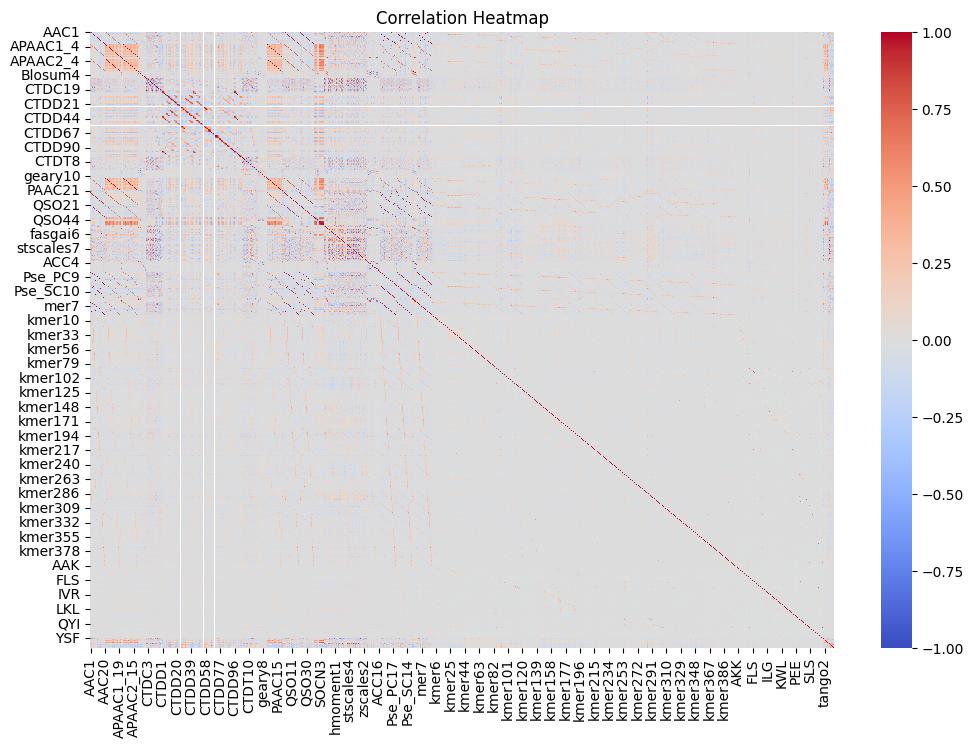

In [10]:
# Correlation matrix for numerical features
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

### Loop 20s

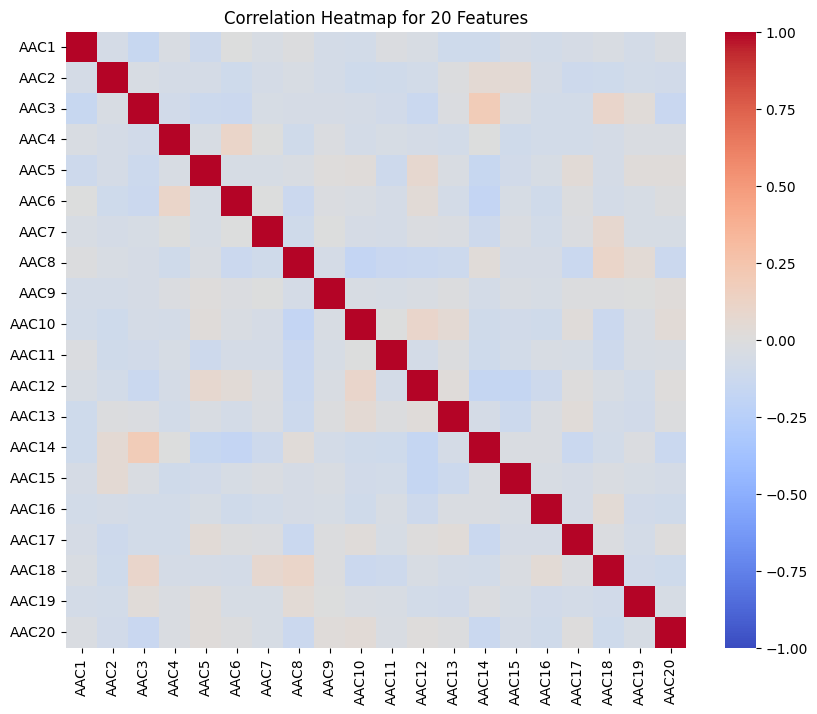

In [11]:
# Function to plot a heatmap of a subset of features
def plot_heatmap(feature_subset):
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix.loc[feature_subset, feature_subset], annot=False, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f"Correlation Heatmap for {len(feature_subset)} Features")
    plt.show()

features = correlation_matrix.columns
chunk_size = 20

# Plot heatmap for each chunk
for i in range(0, len(features), chunk_size):
    feature_subset = features[i:i+chunk_size]
    plot_heatmap(feature_subset)
    break

## Distribution

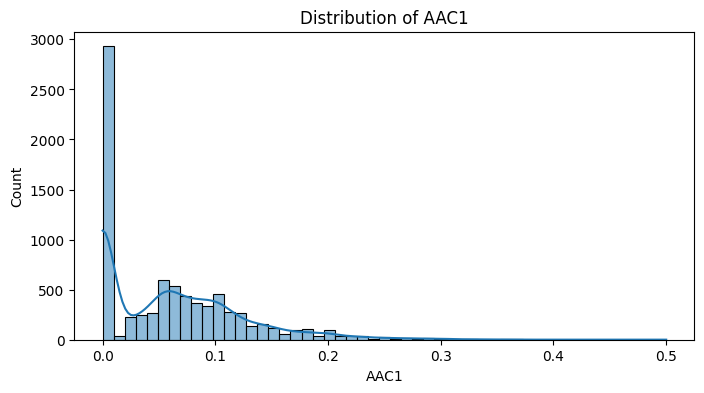

In [12]:
# Plotting the distribution of a few numerical features (AAC1 to AAC10 as examples)
features = train_df.columns

for feature in features:
    plt.figure(figsize=(8, 4))
    sns.histplot(train_df[feature], kde=True)
    plt.title(f"Distribution of {feature}")
    plt.show()
    break

## Outlier

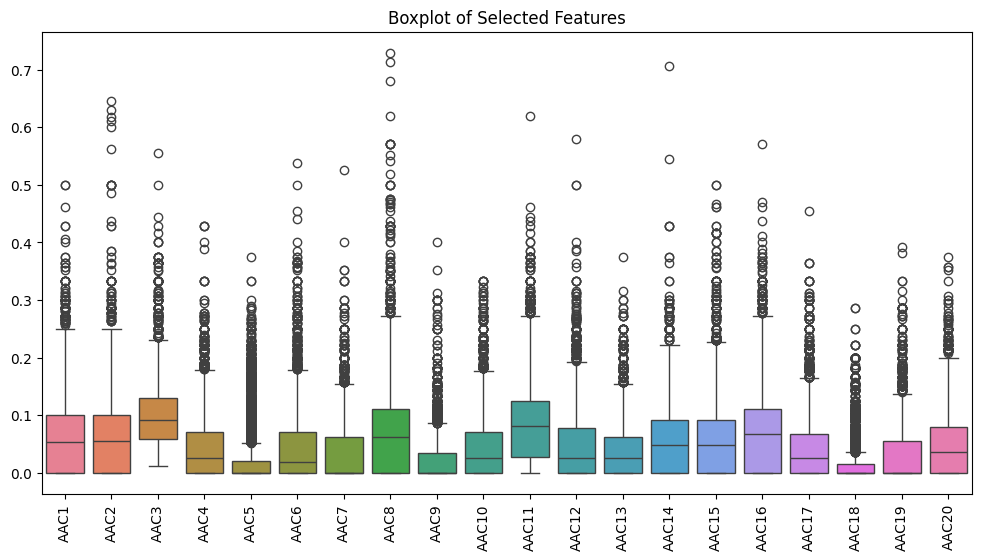

In [13]:
# Boxplot for the features to detect outliers
def plot_boxplot(feature_subset):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=train_df[feature_subset])
    plt.title("Boxplot of Selected Features")
    plt.xticks(rotation=90)
    plt.show()

chunk_size = 20

# Plot heatmap for each chunk
for i in range(0, len(features), chunk_size):
    feature_subset = features[i:i+chunk_size]
    plot_boxplot(feature_subset)
    break

## Pairplot

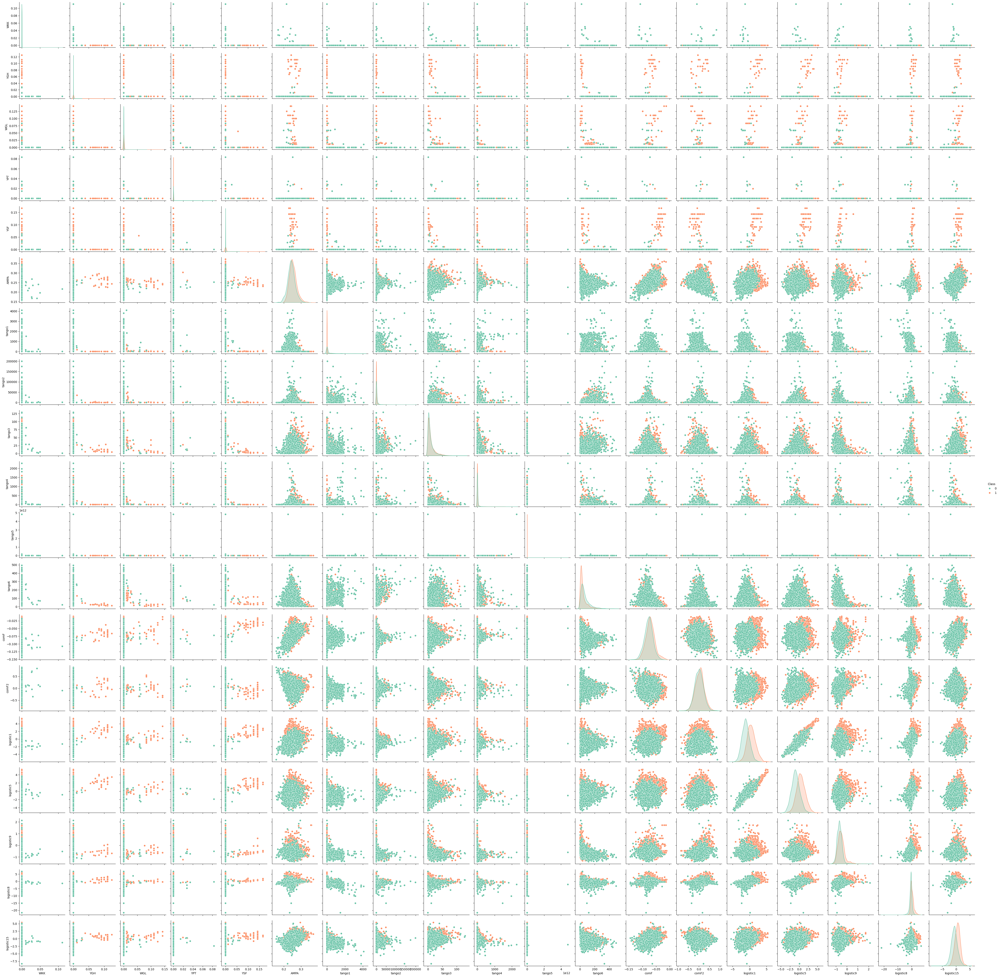

In [14]:
# Pairplot for selected features
sns.pairplot(train_df[features[-20:]], hue='Class', palette="Set2", diag_kind='kde')
plt.show()

## PCA

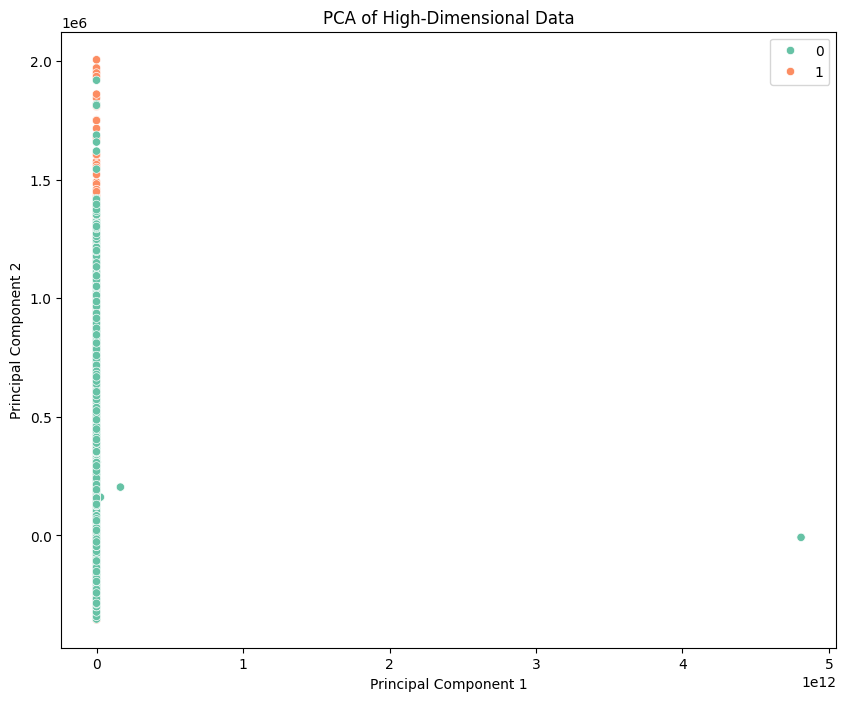

In [15]:
# Separate features and target
X = train_df.drop('Class', axis=1)  # Features
y = train_df['Class']  # Target variable

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions
X_pca = pca.fit_transform(X)

# Create a new DataFrame with PCA results
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['Class'] = y  # Add the target variable to the DataFrame

# Plot the PCA result
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Class', palette='Set2')
plt.title('PCA of High-Dimensional Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

## t-SNE

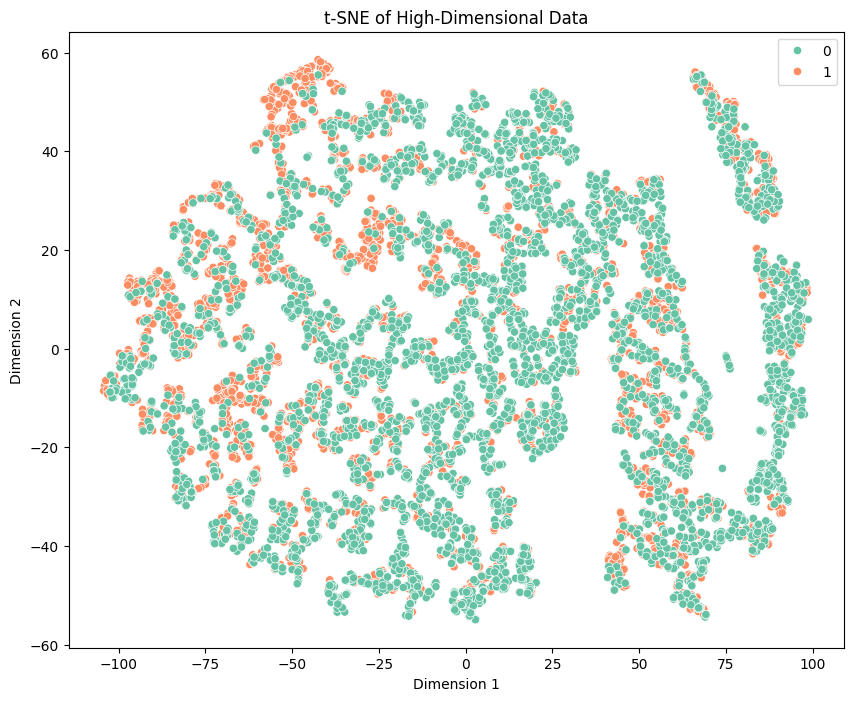

In [16]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)  # Reduce to 2 dimensions
X_tsne = tsne.fit_transform(X)

# Create a new DataFrame with t-SNE results
tsne_df = pd.DataFrame(data=X_tsne, columns=['Dimension 1', 'Dimension 2'])
tsne_df['Class'] = y  # Add the target variable to the DataFrame

# Plot the t-SNE result
plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_df, x='Dimension 1', y='Dimension 2', hue='Class', palette='Set2')
plt.title('t-SNE of High-Dimensional Data')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.show()